# Reconstruction intro
## FBP, CGLS, SIRT

**The goal** of this notebook is to start working with simulated data of the Fan Beam Computed Tomography. In particular we want to consider the following forward model
$$ I = Poiss(I_{0} e^{-Ax})$$
where $A$ is the projection matrix. We want to try different noise levels, which means different levels of $I_{0}$, and compare the results obtained with different recostruction methods: FBP, SIRT, LS, WLS, KL, LS TV, WLS TV, KL TV.


In [95]:
# cil imports
from cil.framework import ImageData, ImageGeometry, DataContainer
from cil.framework import AcquisitionGeometry, AcquisitionData
from cil.optimisation.functions import Function
from cil.processors import Slicer, AbsorptionTransmissionConverter, TransmissionAbsorptionConverter

from cil.optimisation.functions import LeastSquares, WeightedL2NormSquared, KullbackLeibler, OperatorCompositionFunction, ZeroFunction 
from cil.optimisation.functions import IndicatorBox, L2NormSquared, TotalVariation, SumFunction, SmoothMixedL21Norm
from cil.optimisation.algorithms import CGLS, SIRT, GD, PDHG, FISTA
from cil.optimisation.operators import GradientOperator

from cil.plugins.astra.operators import ProjectionOperator
from cil.plugins.astra.processors import FBP

#from cil.version import version
#print (version)

from cil.plugins import TomoPhantom
from cil.utilities.quality_measures import mse, mae, psnr
from cil.utilities import dataexample
from cil.utilities.display import show_geometry

# External imports
from myplot import show2D

import time 
import numpy as np
import matplotlib.pyplot as plt
import scipy.io
import scipy as sp
import logging
import math
logging.basicConfig(level = logging.INFO)



In [96]:
# set up default colour map for visualisation
cmap = "gray"

In [97]:
# set the backend for FBP and the ProjectionOperator
device = 'gpu'


In this notebook we will use a classical Shepp-Logan phantom generated with the [TomoPhantom toolbox](https://github.com/dkazanc/TomoPhantom).

AcquisitionGeometry configured using deprecated method


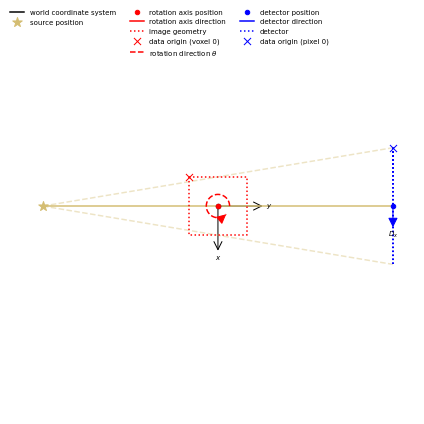

In [98]:
# number of pixels
n_pixels = 256

# Angles
angles = np.linspace(0, 360, 500, endpoint=False, dtype=np.float32)

# set-up fan-beam AcquisitionGeometry
# distance from source to center of rotation
dist_source_center = 6#300.0
# distance from center of rotation to detector
dist_center_detector = 6# 200.0
# physical pixel size
pixel_size_h = 2/n_pixels

# Setup image geometry
ig = ImageGeometry(voxel_num_x=n_pixels, 
                   voxel_num_y=n_pixels, 
                   voxel_size_x=2/n_pixels, 
                   voxel_size_y=2/n_pixels)
# calculate geometrical magnification
mag = (dist_source_center + dist_center_detector) / dist_source_center

ag = AcquisitionGeometry(geom_type='cone',
                           dimension='2D',
                           angles=angles,
                           pixel_num_h=n_pixels,
                           pixel_size_h=pixel_size_h*mag,
                           dist_source_center=dist_source_center,
                           dist_center_detector=dist_center_detector)



# Setup image geometry
ig = ImageGeometry(voxel_num_x=n_pixels, 
                   voxel_num_y=n_pixels, 
                   voxel_size_x=ag.pixel_size_h / mag, 
                   voxel_size_y=ag.pixel_size_h / mag)
show_geometry(ag)
phantom = TomoPhantom.get_ImageData(num_model=1, geometry=ig)

In [99]:
phantom.array[phantom.array<0] = 0
#print(np.min(phantom)) 
# Visualise data
#show2D(phantom, cmap=cmap, num_cols=1, size=(10,10), origin='upper-left')
#plt.savefig('Phantom.png')

Next, we create our simulated tomographic data by projecting our noiseless phantom to the acquisition space.

In [100]:
# Create projection operator using Astra-Toolbox.
A = ProjectionOperator(ig, ag, device)

# Create an acqusition data (numerically)
sino = A.direct(phantom)
#print(np.min(sino))

# Visualise data
#show2D(sino, 'simulated sinogram', cmap=cmap, size=(10,10), origin='upper-left')

23.42687886114724


/home/jovyan/Exercise /myplot.py:290: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_yticklabels(labels_new)


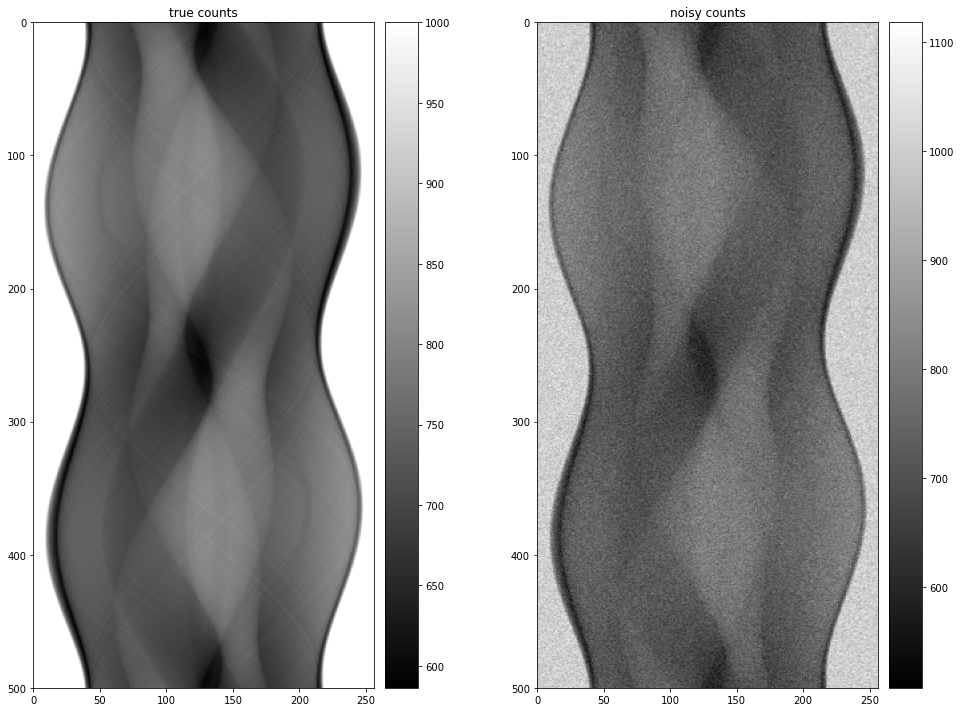

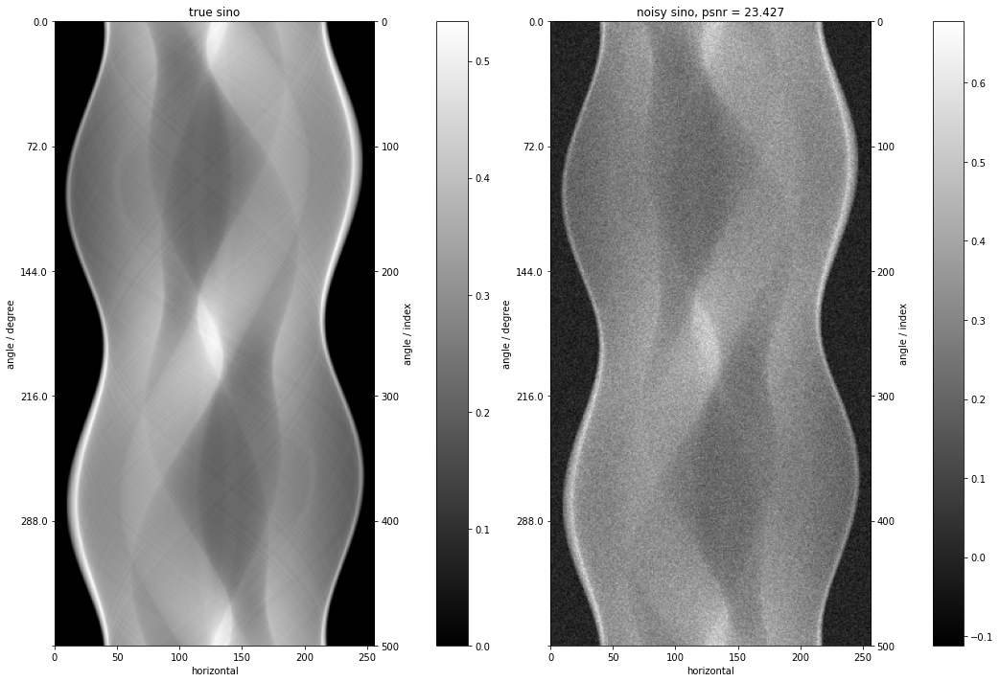

In [101]:
# Incident intensity: lower counts will increase the noise
background_counts = 1000 

# Convert the simulated absorption sinogram to transmission values using Lambert-Beer. 
# Use as mean for Poisson data generation.
# Convert back to absorption sinogram.
counts = background_counts * np.exp(-sino.as_array())
tmp = np.exp(-sino.as_array())
noisy_counts = np.random.poisson(counts)
nonzero = noisy_counts > 0
sino_out = np.zeros_like(sino.as_array())
sino_out[nonzero] = -np.log(noisy_counts[nonzero] / background_counts)


# allocate sino_noisy and fill with noisy data
sino_noisy = ag.allocate()
sino_noisy.fill(sino_out)


psnr_sino = psnr(sino, sino_noisy, data_range = np.max(sino))
print(psnr_sino)

# Visualize the true and noisy data
show2D([counts, noisy_counts], ['true counts', 'noisy counts'], \
       cmap=cmap, num_cols=2, size=(15,10), origin='upper-left')
## Visualize the true and noisy data
show2D([sino, sino_noisy], ['true sino', "noisy sino, psnr = %5.3f" % (psnr_sino)], \
       cmap=cmap, num_cols=2, size=(15,10), origin='upper-left')
#plt.savefig("Sinogram_I0_%7.f.png" %(background_counts))

# Reconstruct the noisy data using FBP

In [102]:
# reconstruct full data
# configure FBP
fbp = FBP(ig, ag, device)
# run on the AcquisitionData
recon_fbp = fbp(sino_noisy)
psnr_fbp = psnr(phantom,recon_fbp, np.max(phantom))
#print(psnr_fbp)

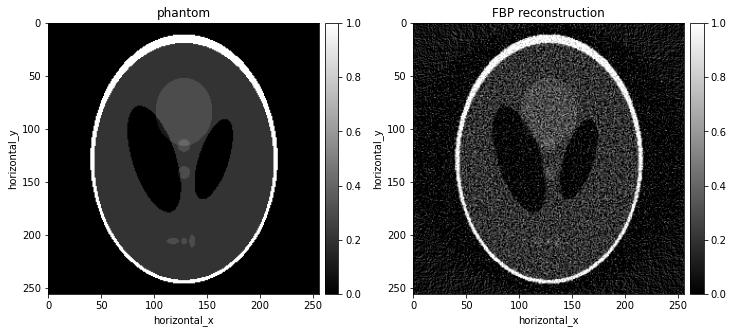

In [103]:
show2D([phantom, recon_fbp], ['phantom', 'FBP reconstruction'], \
       cmap=cmap, fix_range=(0,1),num_cols=2, size=(10,10), origin='upper-left')
linenumy = 128

#plt.figure(figsize=(10,10))
#plt.plot(phantom.get_slice(horizontal_y=linenumy).as_array(),':k',label="phantom")
#plt.plot(recon_fbp.get_slice(horizontal_y=linenumy).as_array(),label="fbp")
#plt.legend(fontsize=20)

# Reconstructing the noisy data using LS TV - FISTA
We create a code to solve the problem with different regularization parameter $\alpha$, and choose the best one in terms of the PSNR
The function we want to minimize is the following:
$$ ||Ax-b||_{2}^{2} + \alpha \, TV(x) $$

FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000010, psnr= 14.120
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000030, psnr= 22.123
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000050, psnr= 26.399
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000071, psnr= 28.157
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000091, psnr= 28.680
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000111, psnr= 28.719
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000131, psnr= 28.561
FISTA setting up
FISTA configured
Initialised GradientOperator with C backen

/tmp/ipykernel_56/636046289.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(5,5))


alpha=0.000212, psnr= 27.412
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000232, psnr= 27.105
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000252, psnr= 26.804
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000273, psnr= 26.512
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000293, psnr= 26.229
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000313, psnr= 25.955
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000333, psnr= 25.693
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000353, psnr= 25.441
FISTA setting up
FISTA configured
Initialised G

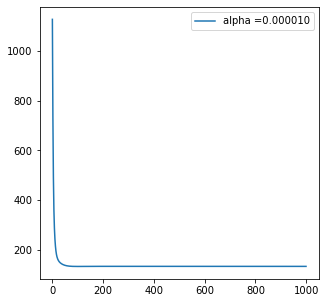

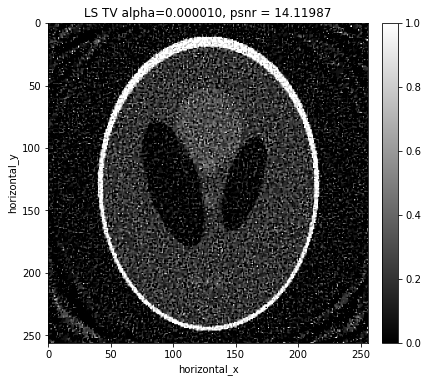

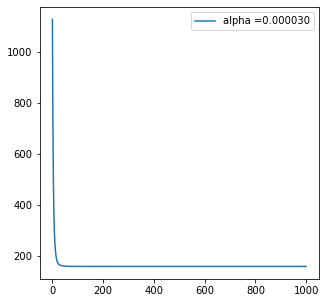

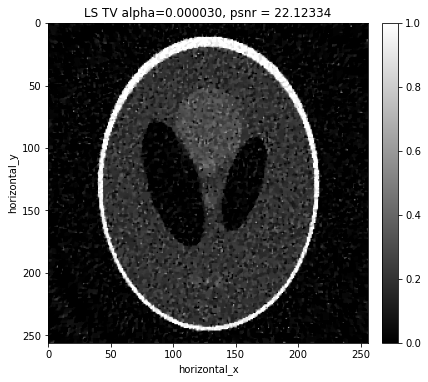

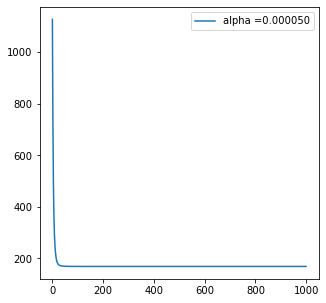

...

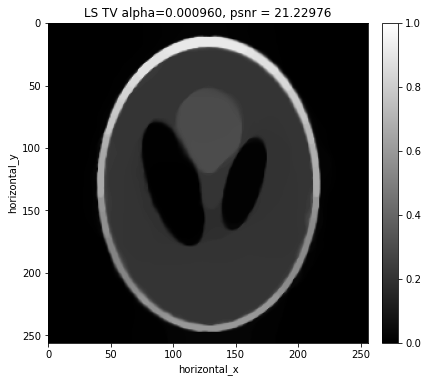

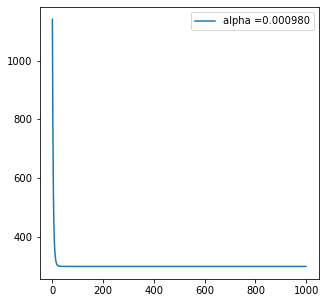

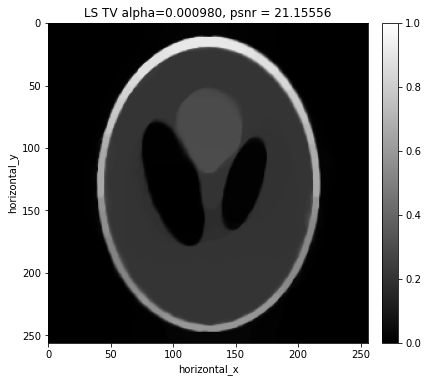

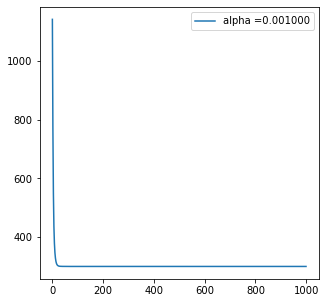

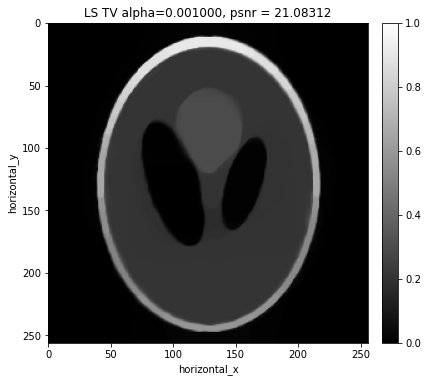

In [104]:
# Selection of the best regularization parametr using LS TV - FISTA
alpha_min = 0.00001
alpha_max = 0.001
alpha_n   = 50
alphas    = np.linspace(alpha_min, alpha_max, alpha_n) 
modulo    = 10 #how often to save reconstructions, for the different values of alpha

#Definition of the fidelity term
f3 = LeastSquares(A, sino_noisy)

#Initialize quantities
x0 = ig.allocate(0.0)
psnr_ls_tv_alpha = np.zeros_like(alphas)
max_psnr = 0

# Run the loop over the different values of alpha
for i in range(alpha_n):
    alpha = alphas[i]
    # Defining the regularization term with the new alpha
    GTV = alpha*TotalVariation()
    # Setting up FISTA
    myFISTATV = FISTA(f=f3, 
                  g=GTV, 
                  x_init=x0 ,
                  max_iteration=1000)
    # Run FISTA
    myFISTATV.run(1000, verbose=0)
    recon_ls_tv = myFISTATV.solution
    psnr_ls_tv_alpha[i] = psnr(phantom,recon_ls_tv, data_range = np.max(phantom))
    
    # plot the objective function
    plt.figure(figsize=(5,5))
    plt.plot( myFISTATV.objective[1:],label="alpha =%7.6f" % (alpha))
    plt.legend(fontsize=10)
    
    # plot the reconstruction 
    show2D([recon_ls_tv], ["LS TV alpha=%7.6f, psnr = %7.5f" % (alpha,psnr_ls_tv_alpha[i])], \
       cmap=cmap,fix_range=(0,1), size=(10,10), origin='upper-left')
    
    # Save the reconstruction (one every "modulo")
    if i%modulo == 0:
        plt.savefig("Reconstruction_LS_TV_alpha_%7.6f_I0_%7.f_.png" %(alpha,background_counts))
        
    # print the value of alpha and the obtained psnr of the reconstruction
    print("alpha=%7.6f, psnr= %5.3f" % (alpha,psnr_ls_tv_alpha[i]))
    
    # Save the best reconstruction
    if psnr_ls_tv_alpha[i]>max_psnr:
        max_psnr   = psnr_ls_tv_alpha[i]
        best_recon = recon_ls_tv
        best_alpha = alpha
        

In [105]:
#print(max_psnr)
recon_ls_tv_fista = best_recon
psnr_ls_tv_fista  = max_psnr
alpha_ls_tv_fista = best_alpha

In [106]:
#recon_ls_tv_fista.shape

In [107]:
#show2D([recon_ls_tv_fista], origin='upper-left')

In [108]:
# Figure with the psnr values for different alpha
#plt.plot(alphas,psnr_ls_tv_alpha)


In [109]:
# plot dell'ultima funzione obiettivo alpha
#plt.plot( myFISTATV.objective[1:])

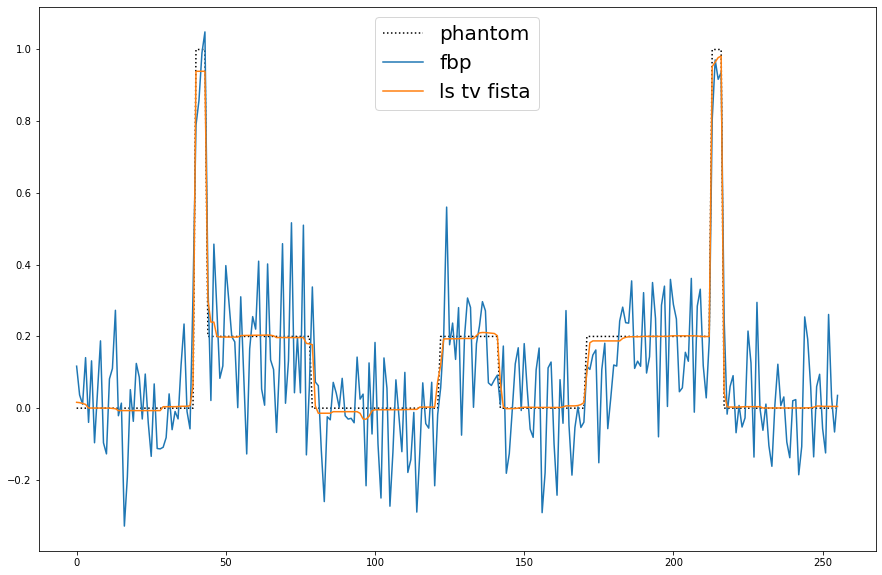

In [110]:
plt.figure(figsize=(15,10))
plt.plot(phantom.get_slice(horizontal_y=linenumy).as_array(),':k',label="phantom")
plt.plot(recon_fbp.get_slice(horizontal_y=linenumy).as_array(),label="fbp")
plt.plot(recon_ls_tv_fista.get_slice(horizontal_y=linenumy).as_array(),label="ls tv fista")
plt.legend(fontsize=20)

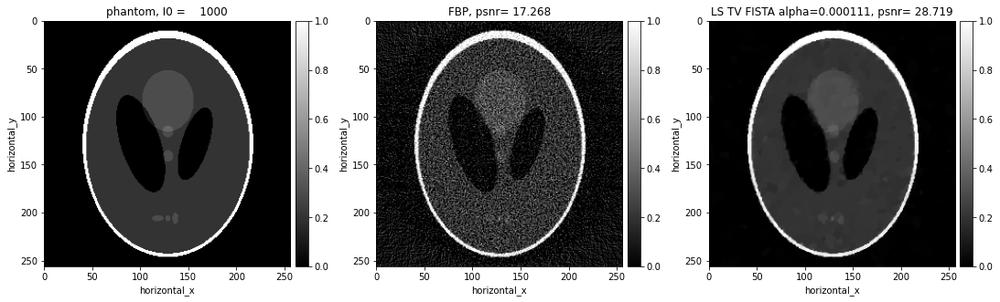

In [111]:
# get and visusualise the results
show2D([phantom, recon_fbp, recon_ls_tv_fista ], ["phantom, I0 = %7.0f" % (background_counts), "FBP, psnr= %5.3f" % (psnr_fbp),\
    "LS TV FISTA alpha=%7.6f, psnr= %5.3f" % (alpha_ls_tv_fista,psnr_ls_tv_fista)], \
       cmap=cmap, fix_range =(0,1), num_cols=3, size=(15,10), origin='upper-left')
plt.savefig("Reconstruction_LS_TV_FISTA_alpha=%7.6f_I0_%7.f.png" %(alpha_ls_tv_fista,background_counts))

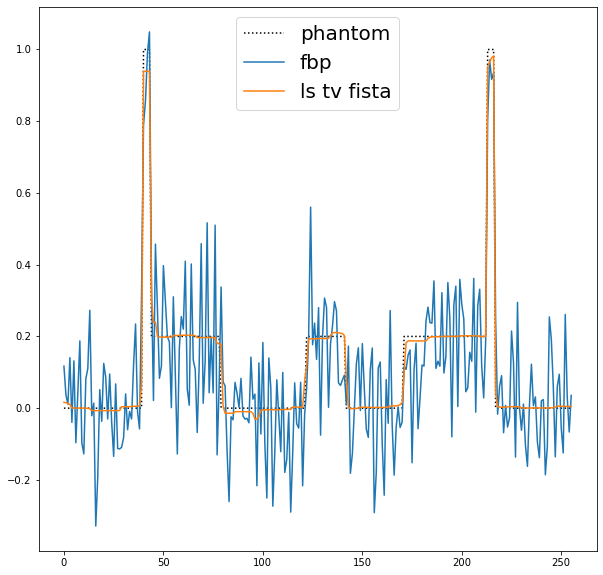

In [112]:
plt.figure(figsize=(10,10))
plt.plot(phantom.get_slice(horizontal_y=linenumy).as_array(),':k',label="phantom")
plt.plot(recon_fbp.get_slice(horizontal_y=linenumy).as_array(),label="fbp")
plt.plot(recon_ls_tv_fista.get_slice(horizontal_y=linenumy).as_array(),label="ls tv fista")
plt.legend(fontsize=20)

FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000010, psnr= 15.828
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000030, psnr= 24.551
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000050, psnr= 27.984
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000071, psnr= 28.761
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000091, psnr= 28.721
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000111, psnr= 28.427
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000131, psnr= 28.043
FISTA setting up
FISTA configured
Initialised GradientOperator with C backen

/tmp/ipykernel_56/2976841942.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(5,5))


alpha=0.000212, psnr= 26.425
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000232, psnr= 26.054
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000252, psnr= 25.701
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000273, psnr= 25.368
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000293, psnr= 25.053
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000313, psnr= 24.754
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000333, psnr= 24.472
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000353, psnr= 24.206
FISTA setting up
FISTA configured
Initialised G

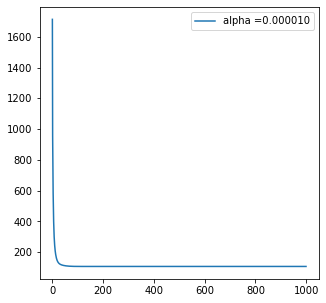

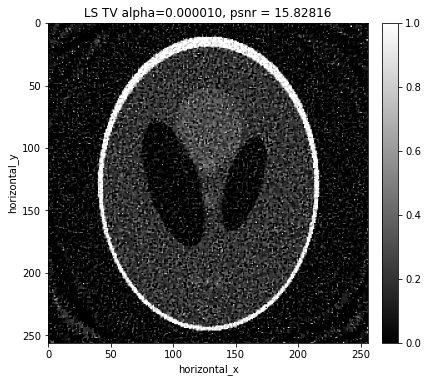

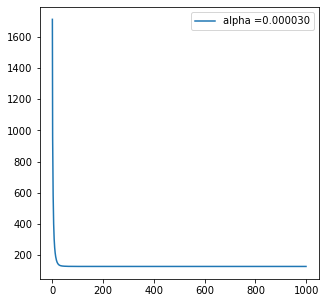

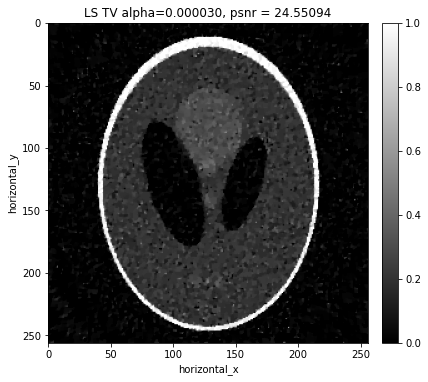

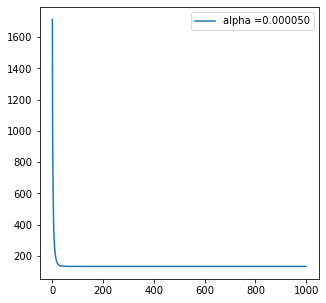

...

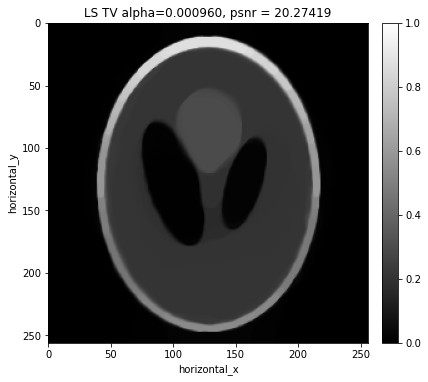

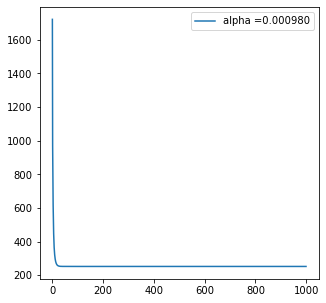

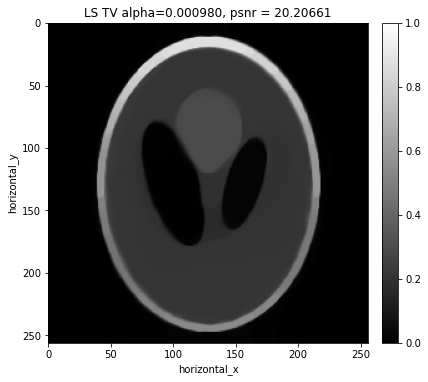

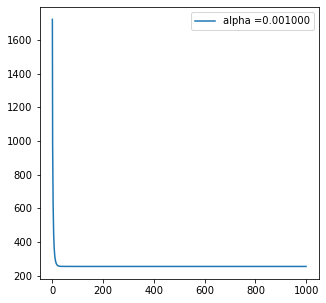

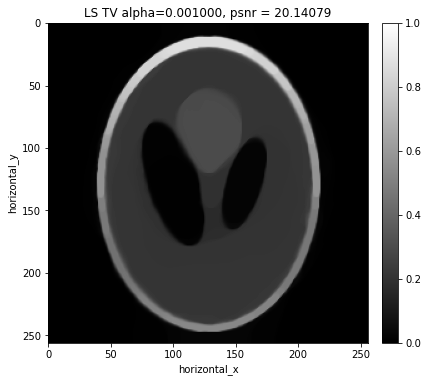

In [113]:
# Selection of the best regularization parametr using WLS TV - FISTA
alpha_min = 0.00001
alpha_max = 0.001
alpha_n   = 50
alphas    = np.linspace(alpha_min, alpha_max, alpha_n) 
modulo    = 10 #10 #how often to save reconstructions, for the different values of alpha

#Definition of the fidelity term
weights = noisy_counts/background_counts
c = DataContainer(weights)
WF = LeastSquares(A, sino_noisy, 1,c)

#Initialize quantities
x0 = ig.allocate(0.0)
psnr_wls_tv_alpha = np.zeros_like(alphas)
w_max_psnr = 0

# Run the loop over the different values of alpha
for i in range(alpha_n):
    alpha = alphas[i]
    # Defining the regularization term with the new alpha
    GTV = alpha*TotalVariation()
    # Setting up FISTA
    myFISTAWTV = FISTA(f=WF, 
                  g=GTV, 
                  x_init=x0 ,
                  max_iteration=1000)
    # Run FISTA
    myFISTAWTV.run(1000, verbose=0)
    recon_wls_tv = myFISTAWTV.solution
    psnr_wls_tv_alpha[i] = psnr(phantom,recon_wls_tv, data_range = np.max(phantom))
    
    # plot the objective function
    plt.figure(figsize=(5,5))
    plt.plot( myFISTAWTV.objective[1:],label="alpha =%7.6f" % (alpha))
    plt.legend(fontsize=10)
    
    # plot the reconstruction 
    show2D([recon_wls_tv], ["WLS TV alpha=%7.6f, psnr = %7.5f" % (alpha,psnr_wls_tv_alpha[i])], \
       cmap=cmap,fix_range=(0,1), size=(10,10), origin='upper-left')
    
    # Save the reconstruction (one every "modulo")
    if i%modulo == 0:
        plt.savefig("Reconstruction_WLS_TV_alpha_%7.6f_I0_%7.f_.png" %(alpha,background_counts))
        
    # print the value of alpha and the obtained psnr of the reconstruction
    print("alpha=%7.6f, psnr= %5.3f" % (alpha,psnr_wls_tv_alpha[i]))
    
    # Save the best reconstruction
    if psnr_wls_tv_alpha[i]>w_max_psnr:
        w_max_psnr   = psnr_wls_tv_alpha[i]
        w_best_recon = recon_wls_tv
        w_best_alpha = alpha

In [114]:
recon_wls_tv_fista = w_best_recon
psnr_wls_tv_fista  = w_max_psnr
alpha_wls_tv_fista = w_best_alpha
print(psnr_wls_tv_fista)

28.761127417173412


0.508
1.118


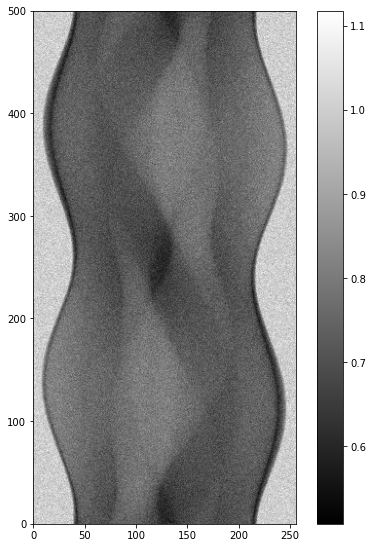

In [125]:
show2D(weights)
print(np.min(weights))
print(np.max(weights))

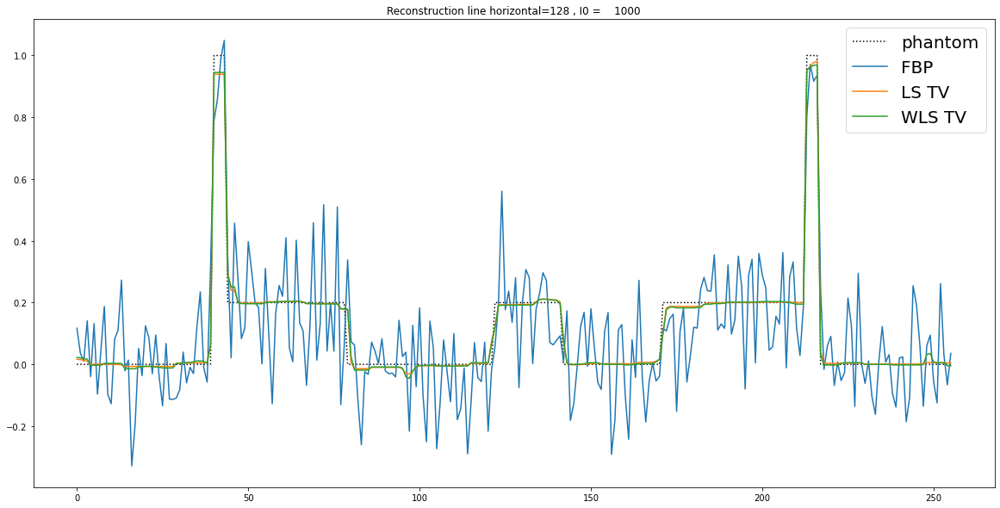

In [115]:
plt.figure(figsize=(20,10))
plt.plot(phantom.get_slice(horizontal_y=linenumy).as_array(),':k',label="phantom")
plt.plot(recon_fbp.get_slice(horizontal_y=linenumy).as_array(),label="FBP")
plt.plot(recon_ls_tv_fista.get_slice(horizontal_y=linenumy).as_array(),label="LS TV")
plt.plot(recon_wls_tv_fista.get_slice(horizontal_y=linenumy).as_array(),label="WLS TV")
plt.legend(fontsize=20)
plt.title("Reconstruction line horizontal=%3.0f , I0 = %7.f" % (linenumy,background_counts))
plt.savefig("Line_horizontal_%3.0f_reconstruction_LS_WLS_TV_I0_%7.f.png" %(linenumy,background_counts))

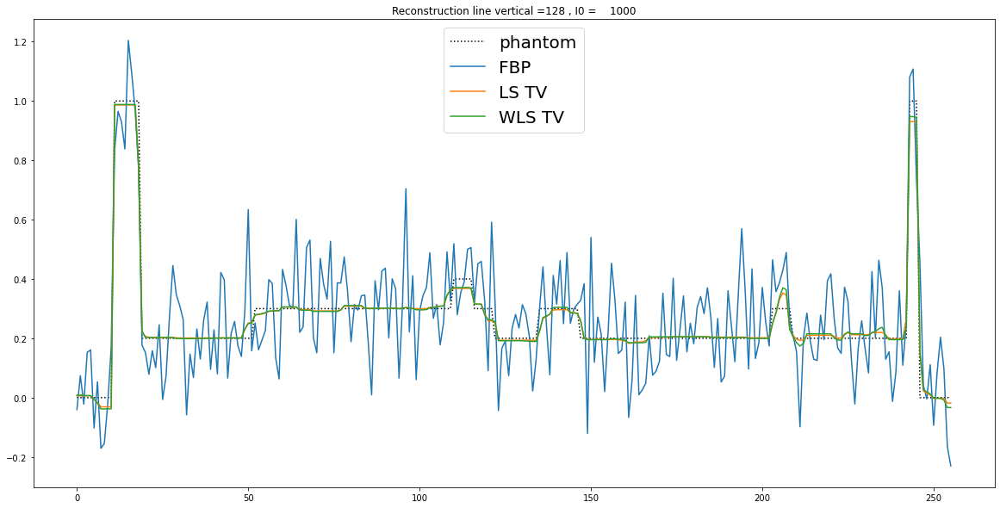

In [116]:
plt.figure(figsize=(20,10))
plt.plot(phantom.get_slice(horizontal_x=linenumy).as_array(),':k',label="phantom")
plt.plot(recon_fbp.get_slice(horizontal_x=linenumy).as_array(),label="FBP")
plt.plot(recon_ls_tv_fista.get_slice(horizontal_x=linenumy).as_array(),label="LS TV")
plt.plot(recon_wls_tv_fista.get_slice(horizontal_x=linenumy).as_array(),label="WLS TV")
plt.legend(fontsize=20)
plt.title("Reconstruction line vertical =%3.0f , I0 = %7.f" % (linenumy,background_counts))
plt.savefig("Line_vertical_%3.0f_reconstruction_LS_WLS_TV_I0_%7.f.png" %(linenumy,background_counts))

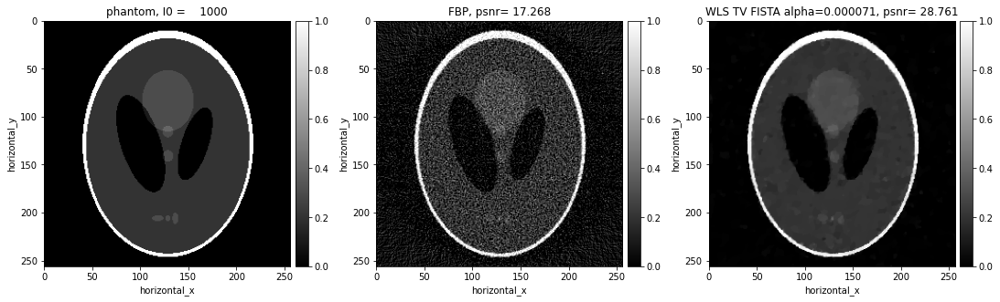

In [117]:
show2D([phantom, recon_fbp, recon_wls_tv_fista ], ["phantom, I0 = %7.0f" % (background_counts), "FBP, psnr= %5.3f" % (psnr_fbp),\
    "WLS TV FISTA alpha=%7.6f, psnr= %5.3f" % (alpha_wls_tv_fista,psnr_wls_tv_fista)], \
       cmap=cmap, fix_range =(0,1), num_cols=3, size=(15,10), origin='upper-left')
plt.savefig("Reconstruction_WLS_TV_FISTA_alpha=%7.6f_I0_%7.f.png" %(alpha_wls_tv_fista,background_counts))

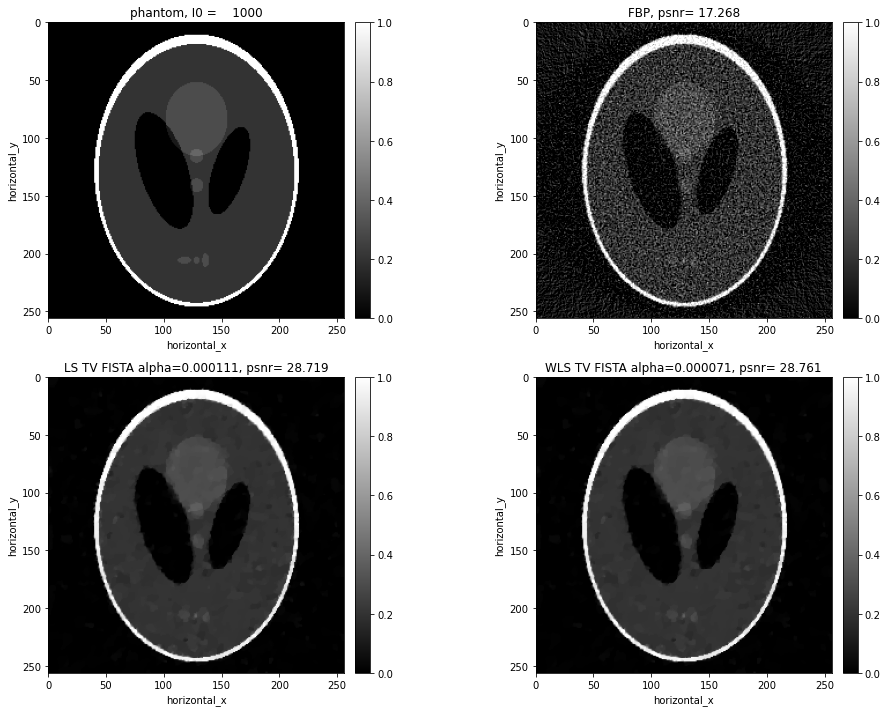

In [118]:
show2D([phantom, recon_fbp, recon_ls_tv_fista,recon_wls_tv_fista ], ["phantom, I0 = %7.0f" % (background_counts), "FBP, psnr= %5.3f" % (psnr_fbp),\
    "LS TV FISTA alpha=%7.6f, psnr= %5.3f" % (alpha_ls_tv_fista,psnr_ls_tv_fista),\
    "WLS TV FISTA alpha=%7.6f, psnr= %5.3f" % (alpha_wls_tv_fista,psnr_wls_tv_fista)], \
       cmap=cmap, fix_range =(0,1), num_cols=2, size=(15,10), origin='upper-left')
plt.savefig("Reconstruction_WLS_LS_TV_FISTA_I0_%7.f.png" %(background_counts))

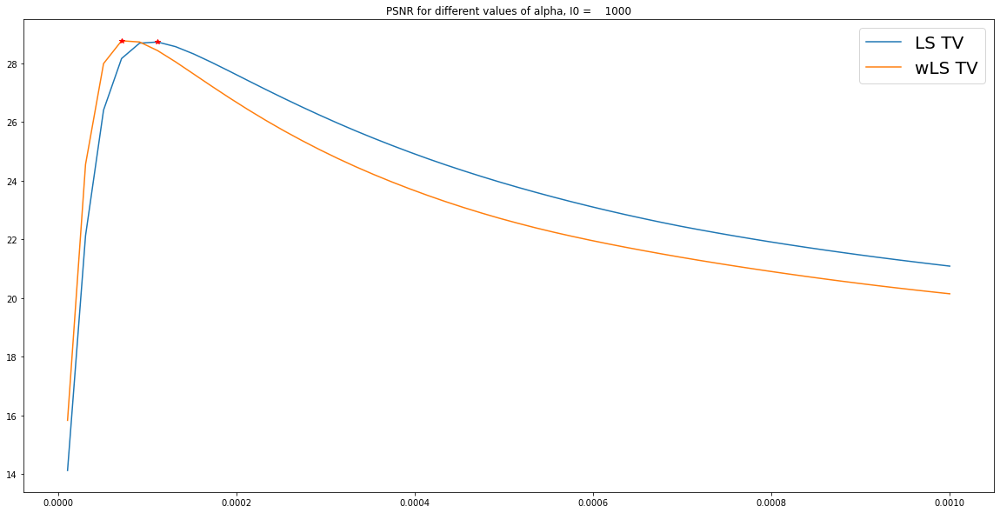

In [119]:
# da rifare andare nel caso di WLS TV
plt.figure(figsize=(20,10))
plt.plot(alphas,psnr_ls_tv_alpha,label="LS TV")
plt.plot(alphas,psnr_wls_tv_alpha,label="wLS TV")
plt.plot(alpha_ls_tv_fista, psnr_ls_tv_fista, '*r')
plt.plot(alpha_wls_tv_fista, psnr_wls_tv_fista, '*r')
plt.legend(fontsize=20)
plt.title("PSNR for different values of alpha, I0 = %7.f" % (background_counts))
plt.savefig("PSNR_LS_WLS_TV_I0_%7.f.png" %(background_counts))

#plt.figure(figsize=(20,10))
#plt.plot(alphas,psnr_ls_tv_alpha,label="LS TV")
#plt.plot(alphas,psnr_wls_tv_alpha,label="WLS TV")
#plt.plot(alpha_ls_tv_fista,psnr_ls_tv_fista,'*r')
#plt.plot(alpha_wls_tv_fista,psnr_wls_tv_fista,'*r')
#plt.legend(fontsize=20)
#plt.title("PSNR values of the LSTV and WLSTV reconstructions, I0 = %7.f" % (background_counts))
#plt.savefig("PSNR_LSTV_WLSTV_I0_%7.f.png" %(background_counts))

In [120]:
#show2D([phantom, recon_fbp,recon_ls_tv_fista, recon_wls_tv_fista], ["phantom, I0 = %7.0f" %(background_counts), "FBP, psnr = %7.5f" % (psnr_fbp),"LS TV, alpha = %7.6f, psnr = %7.5f" % (alpha_ls_tv_fista,psnr_ls_tv_fista),"WLS TV, alpha = %7.6f, psnr = %7.5f" % (alpha_wls_tv_fista,psnr_wls_tv_fista)], \
#       cmap=cmap,fix_range=(0,1), num_cols=2, size=(15,10), origin='upper-left')
#plt.savefig("Reconstruction_TV_I0_%7.f.png" %(background_counts))

# Defining the KL fidelity term before the logaritm
The KL function of $u$ and $v$, where $u = \mathrm{Poiss}(v)$ is the following $ KL(u,v) = u \log(\frac{u}{v})-u+v$
Considering $$b = \mathrm{Poiss}(I_{0} e^{(-Ax)})$$
we can define:
$$KL(b,I_{0} e^{(-Ax)}) = \sum_{i} \bigg[b_{i} \log (\frac{b_{i}}{I_{0} e^{-(Ax)_{i}}}) - b_{i} + I_{0} e^{-(Ax)_{i}}\bigg] = 
\sum_{i} \bigg[ b_{i}\log(b_{i}) - b_{i} \log(I_{0}) - b_{i} \log(I_{0} e^{-(Ax)_{i}}) - b_{i} + I_{0} e^{-(Ax)_{i}} \bigg]$$
We want to minimize the KL function with respect to $x$, so we consider
$$KL(b,I_{0} e^{(-Ax)}) = \sum_{i} \bigg[ b_{i} (Ax)_{i} + I_{0} e^{-(Ax)_{i}}\bigg] = \sum_{i} \bigg[ \frac{b_{i}}{I_{0}}(Ax)_{i} + e^{-(Ax)_{i}}\bigg]$$

In [121]:
#Defining the KL fidelity term 
class KL_prelog(Function):
    def __init__(self, d):
        super(KL_prelog, self).__init__(L=1)
        self.d  = d   # d = b/I0
        
    #@property
    #def L(self): 
    #    return 0.00001

    def __call__(self, x):
        vec = x.as_array()
        res = self.d*vec+np.exp(-vec)
        return np.sum(res)


    def gradient(self, x, out=None):
        vec  = x.as_array()
        der  = self.d-np.exp(-vec)
        #res2 = np.sum(der)
        if out is not None:
            out.fill (der)
        else:
            return der

In [122]:
#d2 = noisy_counts/background_counts
#KL_pre = KL_prelog(d = d2)
#f_KL = OperatorCompositionFunction(KL_pre, A)


In [123]:
#alpha = 0.0004
#x0 = ig.allocate()
#GTV = alpha*TotalVariation()
#myFISTAKLTV = FISTA(f=f_KL, 
#                  g=GTV, 
#                  x_init=x0 ,
#                  max_iteration=1000)

In [ ]:
# Selection of the best regularization parametr using KL TV - FISTA
alpha_min = 0.00001
alpha_max = 0.001
alpha_n   = 50
alphas    = np.linspace(alpha_min, alpha_max, alpha_n) 
modulo    = 10 #10 #how often to save reconstructions, for the different values of alpha

#Definition of the fidelity term
d2 = noisy_counts/background_counts
KL_pre = KL_prelog(d = d2)
f_KL = OperatorCompositionFunction(KL_pre, A)

#Initialize quantities
x0 = ig.allocate(0.0)
psnr_kl_tv_alpha = np.zeros_like(alphas)
kl_max_psnr = 0

# Run the loop over the different values of alpha
for i in range(alpha_n):
    alpha = alphas[i]
    # Defining the regularization term with the new alpha
    GTV = alpha*TotalVariation()
    # Setting up FISTA
    myFISTAKLTV = FISTA(f=f_KL, 
                  g=GTV, 
                  x_init=x0 ,
                  max_iteration=1000)
    # Run FISTA
    myFISTAKLTV.run(1000, verbose=0)
    recon_kl_tv = myFISTAKLTV.solution
    psnr_kl_tv_alpha[i] = psnr(phantom,recon_kl_tv, data_range = np.max(phantom))
    
    # plot the objective function
    plt.figure(figsize=(5,5))
    plt.plot( myFISTAKLTV.objective[1:],label="alpha =%7.6f" % (alpha))
    plt.legend(fontsize=10)
    
    # plot the reconstruction 
    show2D([recon_kl_tv], ["KL TV alpha=%7.6f, psnr = %7.5f" % (alpha,psnr_kl_tv_alpha[i])], \
       cmap=cmap,fix_range=(0,1), size=(10,10), origin='upper-left')
    
    # Save the reconstruction (one every "modulo")
    if i%modulo == 0:
        plt.savefig("Reconstruction_KL_TV_alpha_%7.6f_I0_%7.f_.png" %(alpha,background_counts))
        
    # print the value of alpha and the obtained psnr of the reconstruction
    print("alpha=%7.6f, psnr= %5.3f" % (alpha,psnr_kl_tv_alpha[i]))
    
    # Save the best reconstruction
    if psnr_kl_tv_alpha[i]>kl_max_psnr:
        kl_max_psnr   = psnr_kl_tv_alpha[i]
        kl_best_recon = recon_kl_tv
        kl_best_alpha = alpha

FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000010, psnr= 20.928
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000030, psnr= 28.550
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000050, psnr= 28.610
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000071, psnr= 27.866
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000091, psnr= 27.051
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000111, psnr= 26.283
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000131, psnr= 25.584
FISTA setting up
FISTA configured
Initialised GradientOperator with C backen

/tmp/ipykernel_56/1353801763.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(5,5))


alpha=0.000212, psnr= 23.458
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000232, psnr= 23.059
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000252, psnr= 22.703
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000273, psnr= 22.387
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000293, psnr= 22.109
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000313, psnr= 21.857
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000333, psnr= 21.628
FISTA setting up
FISTA configured
Initialised GradientOperator with C backend running with  3  threads
alpha=0.000353, psnr= 21.415
FISTA setting up
FISTA configured
Initialised G

In [89]:
recon_kl_tv_fista = kl_best_recon
psnr_kl_tv_fista  = kl_max_psnr
alpha_kl_tv_fista = kl_best_alpha
print(psnr_kl_tv_fista)

26.902487708775205


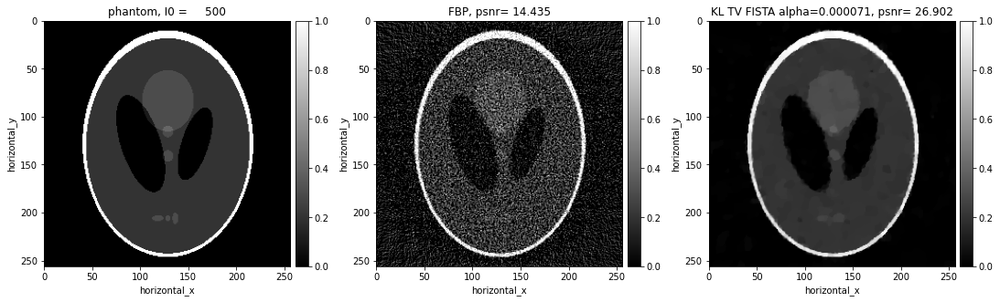

In [90]:
show2D([phantom, recon_fbp, recon_kl_tv_fista ], ["phantom, I0 = %7.0f" % (background_counts), "FBP, psnr= %5.3f" % (psnr_fbp),\
    "KL TV FISTA alpha=%7.6f, psnr= %5.3f" % (alpha_kl_tv_fista,psnr_kl_tv_fista)], \
       cmap=cmap, fix_range =(0,1), num_cols=3, size=(15,10), origin='upper-left')
plt.savefig("Reconstruction_KL_TV_FISTA_alpha=%7.6f_I0_%7.f.png" %(alpha_kl_tv_fista,background_counts))

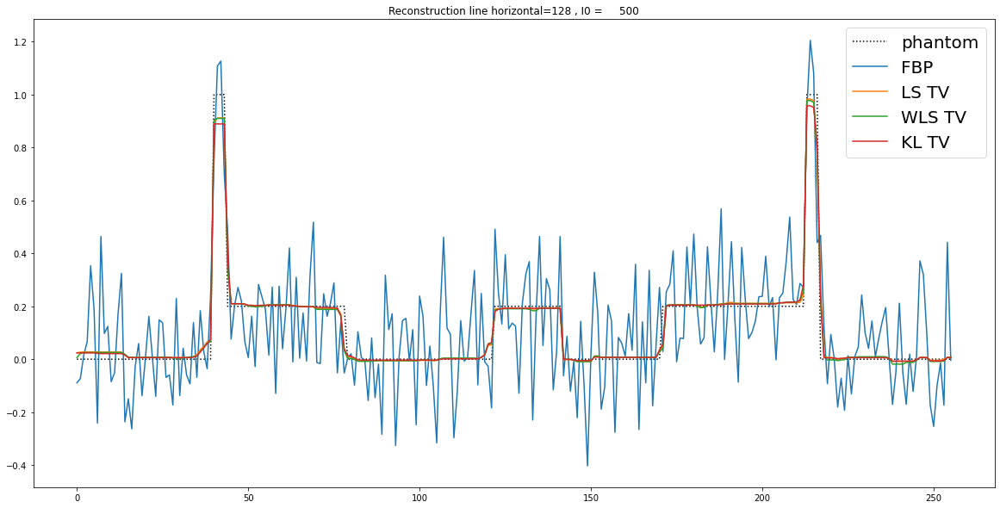

In [91]:
plt.figure(figsize=(20,10))
plt.plot(phantom.get_slice(horizontal_y=linenumy).as_array(),':k',label="phantom")
plt.plot(recon_fbp.get_slice(horizontal_y=linenumy).as_array(),label="FBP")
plt.plot(recon_ls_tv_fista.get_slice(horizontal_y=linenumy).as_array(),label="LS TV")
plt.plot(recon_wls_tv_fista.get_slice(horizontal_y=linenumy).as_array(),label="WLS TV")
plt.plot(recon_kl_tv_fista.get_slice(horizontal_y=linenumy).as_array(),label="KL TV")
plt.legend(fontsize=20)
plt.title("Reconstruction line horizontal=%3.0f , I0 = %7.f" % (linenumy,background_counts))
plt.savefig("Line_horizontal_%3.0f_reconstruction_LS_WLS_KL_TV_I0_%7.f.png" %(linenumy,background_counts))

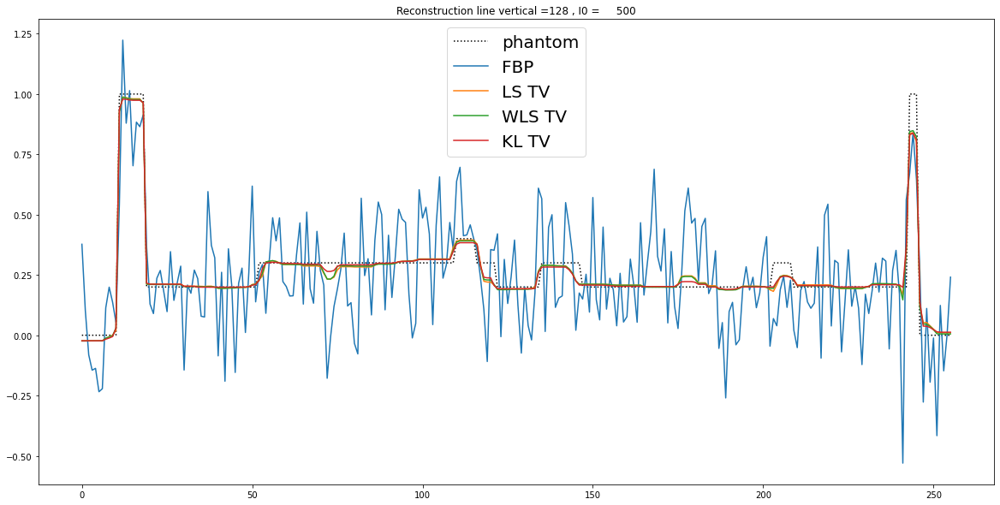

In [92]:
plt.figure(figsize=(20,10))
plt.plot(phantom.get_slice(horizontal_x=linenumy).as_array(),':k',label="phantom")
plt.plot(recon_fbp.get_slice(horizontal_x=linenumy).as_array(),label="FBP")
plt.plot(recon_ls_tv_fista.get_slice(horizontal_x=linenumy).as_array(),label="LS TV")
plt.plot(recon_wls_tv_fista.get_slice(horizontal_x=linenumy).as_array(),label="WLS TV")
plt.plot(recon_kl_tv_fista.get_slice(horizontal_x=linenumy).as_array(),label="KL TV")
plt.legend(fontsize=20)
plt.title("Reconstruction line vertical =%3.0f , I0 = %7.f" % (linenumy,background_counts))
plt.savefig("Line_vertical_%3.0f_reconstruction_LS_WLS_KL_TV_I0_%7.f.png" %(linenumy,background_counts))

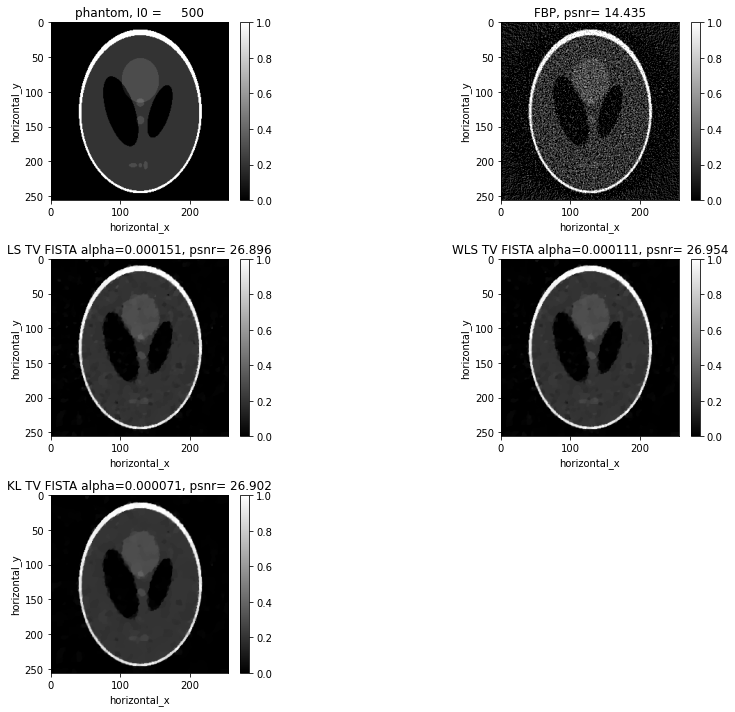

In [93]:
show2D([phantom, recon_fbp, recon_wls_tv_fista,recon_wls_tv_fista, recon_kl_tv_fista ], ["phantom, I0 = %7.0f" % (background_counts), "FBP, psnr= %5.3f" % (psnr_fbp),\
    "LS TV FISTA alpha=%7.6f, psnr= %5.3f" % (alpha_ls_tv_fista,psnr_ls_tv_fista),\
    "WLS TV FISTA alpha=%7.6f, psnr= %5.3f" % (alpha_wls_tv_fista,psnr_wls_tv_fista), \
    "KL TV FISTA alpha=%7.6f, psnr= %5.3f" % (alpha_kl_tv_fista,psnr_kl_tv_fista)], \
       cmap=cmap, fix_range =(0,1), num_cols=2, size=(15,10), origin='upper-left')
plt.savefig("Reconstruction_WLS_LS_KL_TV_FISTA_I0_%7.f.png" %(background_counts))

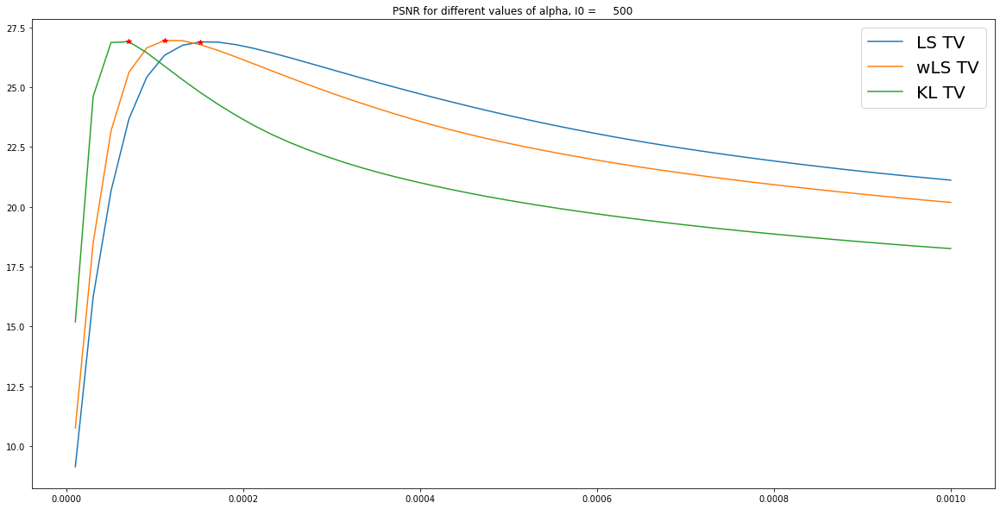

In [94]:
plt.figure(figsize=(20,10))
plt.plot(alphas,psnr_ls_tv_alpha,label="LS TV")
plt.plot(alphas,psnr_wls_tv_alpha,label="wLS TV")
plt.plot(alphas,psnr_kl_tv_alpha,label="KL TV")
plt.plot(alpha_ls_tv_fista, psnr_ls_tv_fista, '*r')
plt.plot(alpha_wls_tv_fista, psnr_wls_tv_fista, '*r')
plt.plot(alpha_kl_tv_fista, psnr_kl_tv_fista, '*r')
plt.legend(fontsize=20)
plt.title("PSNR for different values of alpha, I0 = %7.f" % (background_counts))
plt.savefig("PSNR_LS_WLS_KL_TV_I0_%7.f.png" %(background_counts))

In [358]:
#plt.figure(figsize=(20,10))
#plt.plot(phantom.get_slice(horizontal_y=linenumy).as_array(),':k',label="phantom")
#plt.plot(recon_fbp.get_slice(horizontal_y=linenumy).as_array(),label="FBP")
#plt.plot(recon_ls_tv_fista.get_slice(horizontal_y=linenumy).as_array(),label="LS TV")
#plt.plot(recon_wls_tv_fista.get_slice(horizontal_y=linenumy).as_array(),label="WLS TV")
#plt.legend(fontsize=20)
#plt.title("Reconstruction line=%3.0f , I0 = %7.f" % (linenumy,background_counts))
#plt.savefig("Line_%3.0f_reconstruction_I0_%7.f.png" %(linenumy,background_counts))

In [138]:
# LS TVsmooth with GD

# List of alphas to try
#alpha_min = 0.00001
#alpha_max = 0.0001
#alpha_n   = 10
#alphas = np.linspace(alpha_min, alpha_max, alpha_n) #np.linspace(alpha_min, alpha_max, alpha_n)

# Prepare the variables
#x0 = ig.allocate(0.0)
#psnr_ls_tv_alpha = np.zeros_like(alphas)
#max_psnr = 0
#epsilon = 1e-6
# Preparing the gradient operator and the fidelity term with are fixed
#Grad = GradientOperator(ig)
#f2gd = OperatorCompositionFunction(0.5*L2NormSquared(b=sino_noisy), A)

# Loop for the different values of the regularization parameters
#for i in range(alpha_n):
#    alpha = alphas[i]
#    f1gd = OperatorCompositionFunction(alpha*SmoothMixedL21Norm(epsilon), Grad)
#    # Sum two smooth functionals together
#    objective_function = f1gd  +  f2gd
#    # Define GD
#    #gd_ls_tv = GD(x0, objective_function, step_size=None,alpha= 1e9, \
#    #      max_iteration = 100000, update_objective_interval = 500)
#    gd_ls_tv = GD(x0, objective_function, step_size=1e-3, \
#          max_iteration = 100000, update_objective_interval = 500)
#    gd_ls_tv.run(10000, verbose=1)
#    recon_ls_tv = gd_ls_tv.solution
#    psnr_ls_tv_alpha[i] = psnr(phantom,recon_ls_tv, data_range = np.max(phantom))
#    print("alpha=%7.6f, psnr= %5.3f" % (alpha,psnr_ls_tv_alpha[i]))
#    if psnr_ls_tv_alpha[i]>max_psnr:
#        max_psnr   = psnr_ls_tv_alpha[i]
#        best_recon = recon_ls_tv
#        best_alpha = alpha

In [232]:
#print(max_psnr)
#recon_ls_tv = best_recon
#psnr_ls_tv  = max_psnr
#alpha_ls_tv = best_alpha

#show2D([phantom, recon_fbp,recon_ls_tv], ['phantom', "FBP, psnr = %7.5f" % (psnr_fbp),"LS TV, alpha = %7.6f, psnr = %7.5f" % (alpha_ls_tv,psnr_ls_tv)], \
#       cmap=cmap,fix_range=(0,1), num_cols=3, size=(15,10), origin='upper-left')

In [233]:
# WLS TVsmooth with GD

# List of alphas to try
#alpha_min = 0.00001
#alpha_max = 0.00001
#alpha_n   = 1
#alphas = np.linspace(alpha_min, alpha_max, alpha_n) #np.linspace(alpha_min, alpha_max, alpha_n)

#weights = noisy_counts/background_counts
#c = DataContainer(weights)

# Prepare the variables
#x0 = ig.allocate(0.0)
#psnr_wls_tv_alpha = np.zeros_like(alphas)
#max_psnr = 0
#epsilon = 1e-6
# Preparing the gradient operator and the fidelity term with are fixed
#Grad = GradientOperator(ig)
#f4gd = OperatorCompositionFunction(WeightedL2NormSquared(weight = c, b = sino_noisy),A)

# Loop for the different values of the regularization parameters
#for i in range(alpha_n):
#    alpha = alphas[i]
#    f1gd = OperatorCompositionFunction(alpha*SmoothMixedL21Norm(epsilon), Grad)
#    # Sum two smooth functionals together
#    objective_function = f1gd  +  WF
#    # Define GD
#    #gd_wls_tv = GD(x0, objective_function, step_size=None,alpha= 1e9, \
#    #      max_iteration = 100000, update_objective_interval = 500)
#    gd_wls_tv = GD(x0, objective_function, step_size=1e-3, \
#          max_iteration = 100000, update_objective_interval = 500)
#    gd_wls_tv.run(10000, verbose=1)
#    recon_wls_tv = gd_wls_tv.solution
#    psnr_wls_tv_alpha[i] = psnr(phantom,recon_wls_tv, data_range = np.max(phantom))
#    print("alpha=%7.6f, psnr= %5.3f" % (alpha,psnr_wls_tv_alpha[i]))
#    if psnr_ls_tv_alpha[i]>max_psnr:
#        max_psnr_w   = psnr_wls_tv_alpha[i]
#        best_recon_w = recon_wls_tv
#        best_alpha_w = alpha

In [234]:
#print(max_psnr)
#recon_wls_tv = best_recon_w
#psnr_wls_tv  = max_psnr_w
#alpha_wls_tv = best_alpha_w

#show2D([phantom, recon_fbp,recon_ls_tv, recon_wls_tv], ['phantom', "FBP, psnr = %7.5f" % (psnr_fbp),"LS TV, alpha = %7.6f, psnr = %7.5f" % (alpha_ls_tv,psnr_ls_tv),"WLS TV, alpha = %7.6f, psnr = %7.5f" % (alpha_wls_tv,psnr_wls_tv)], \
#       cmap=cmap,fix_range=(0,1), num_cols=2, size=(15,10), origin='upper-left')

In [235]:
# Set up Smothed TV
#x0 = ig.allocate(0.0)
# Smoothing parameter
#epsilon = 1e-8
#alpha = 4e-5
# Smooth TV functional
#Grad = GradientOperator(ig)
#f1gd = OperatorCompositionFunction(alpha*SmoothMixedL21Norm(epsilon), Grad)
# Least squares from basic building blocks
#f2gd = OperatorCompositionFunction(0.5*L2NormSquared(b=sino_noisy), A)

# Sum two smooth functionals together
#objective_function = f1gd  +  f2gd

# Set algorithm parameters and initialise algorithm
#step_size = 0.00002
#x0 = ig2d.allocate()

#gdbt = GD(x0, objective_function, step_size=1e-3, \
#          max_iteration = 100000, update_objective_interval = 100)



In [236]:
#print(objective_function(phantom))

In [49]:
#gdbt.run(50000, verbose=1)



In [50]:
#gdbt.run(5000, verbose=1)

In [51]:
#gdbt.run(5000, verbose=1)

In [52]:
#gdbt.run(5000, verbose=1)

In [53]:
#psnr_ls_tv = psnr(phantom,gdbt.solution, data_range = np.max(phantom))
#print(psnr_ls_tv)
#show2D(gdbt.solution)

In [54]:
#plt.semilogy( gdbt.objective[1:])

We try the SIRT algorithm

In [359]:
#x0 = ig.allocate()
#constraint = IndicatorBox(lower=0)

#sirt = SIRT(max_iteration=100)
#sirt.set_up(initial=x0, 
#            operator=A, 
#            constraint=constraint, 
#            data=sino_noisy)
#sirt.update_objective_interval = 10
#sirt.run(100)

#recon_sirt_noisy = sirt.solution
#psnr_sirt = psnr(phantom,recon_sirt_noisy, np.max(phantom))
#print(psnr_sirt)

In [360]:
#show2D([phantom, recon_fbp, recon_ls_tv_fista, recon_sirt_noisy], \
#       ['phantom', 'FBP, noisy projections', 'LS, noisy projections', 'SIRT, noisy projections'], \
#       cmap=cmap,fix_range=(0,1), num_cols=2, size=(15,15), origin='upper-left')

In [361]:
#plt.figure(figsize=(10,10))
#plt.plot(phantom.get_slice(horizontal_y=linenumy).as_array(),':k',label="phantom")
#plt.plot(recon_fbp.get_slice(horizontal_y=linenumy).as_array(),label="fbp")
#plt.plot(recon_ls_tv_fista.get_slice(horizontal_y=linenumy).as_array(),label="ls")
#plt.plot(recon_sirt_noisy.get_slice(horizontal_y=linenumy).as_array(),label="SIRT")
#plt.legend(fontsize=20)

Weighted least squares

In [362]:
#weights = noisy_counts/background_counts
#c = DataContainer(weights)
#print(c.shape)
#f = LeastSquares(A, sino_noisy, 1,c)
##f = LeastSquares(A, sino_noisy)
##f = LeastSquares(A, sino_noisy,c = 1,weight = weights)
##c = f(phantom)
#gd = GD(x_init=ig.allocate(), objective_function=f, step_size=None, 
#            max_iteration=1000, update_objective_interval = 10)
#gd.run(1000, verbose=1)

##f = WeightedL2NormSquared(c)

In [363]:
#recon_wls = gd.solution
#psnr_wls = psnr(phantom,recon_wls, np.max(phantom))
#print(psnr_wls)
#show2D([phantom, recon_fbp, recon_ls,recon_sirt_noisy,recon_wls, ], ['phantom', 'FBP','LS','SIRT','WLS'], \
#       cmap=cmap,fix_range = (0,1), num_cols=5, size=(15,10), origin='upper-left')

In [364]:
#plt.figure(figsize=(20,10))
#plt.plot(phantom.get_slice(horizontal_y=linenumy).as_array(),':k',label="phantom")
#plt.plot(recon_fbp.get_slice(horizontal_y=linenumy).as_array(),label="fbp")
#plt.plot(recon_ls.get_slice(horizontal_y=linenumy).as_array(),label="ls")
#plt.plot(recon_sirt_noisy.get_slice(horizontal_y=linenumy).as_array(),label="SIRT")
#plt.plot(recon_wls.get_slice(horizontal_y=linenumy).as_array(),label="wls")
#plt.legend(fontsize=20)

Kullback Leibel 

In [365]:
#Defining the KL fidelity term 
#class KL_prelog(Function):
#    def __init__(self, b,A):
#        super(KL_prelog, self).__init__()
#        self.b  = b
#        self.A  = A
#        
#    @property
#    def L(self): 
#        return 0.001
#
#    def __call__(self, x):
#        y   = self.A.direct(x)
#        vec = y.as_array()
#        res = self.b*vec+np.exp(-vec)
#        return np.sum(res)##
#
##
#
#
#    def gradient(self, x, out=None):
#        y   = self.A.direct(x)
#        vec = y.as_array()
#        der  = self.b-vec*np.exp(-vec)
#        res2 = np.sum(der)
#        if out is not None:
#            out.fill (res2)
#        else:
#            return res2

In [366]:
#b2 = noisy_counts/background_counts
#KL_pre = KL_prelog(b = b2, A= A)
##f_KL = OperatorCompositionFunction(KL_pre, A)
#s =KL_pre(phantom)
#g = KL_pre.gradient(phantom)
#print(s)
#print(g)

In [367]:
#alpha = 0.0001
#x0 = ig.allocate()
##b2 = noisy_counts/background_counts
##KL_pre = KL_prelog(b = b2)
##f_KL = OperatorCompositionFunction(KL_pre, A)
#GTV = alpha*TotalVariation()
#myFISTAKLTV = FISTA(f=KL_pre, 
#                  g=GTV, 
#                  x_init=x0 ,
#                  max_iteration=1000)

In [368]:
#myFISTAKLTV.run(100, verbose=1)
#recon_kl_tv = myFISTAKLTV.solution

In [95]:
# Prepare the variables
b2 = noisy_counts/background_counts

x0 = ig.allocate(0.0)
#psnr_ls_tv_alpha = np.zeros_like(alphas)
max_psnr = 0

# Preparing the gradient operator and the fidelity term with are fixed
KL_pre = KL_prelog(b = b2)
f_KL = OperatorCompositionFunction(KL_pre, A)
Grad = GradientOperator(ig)
#f2gd = OperatorCompositionFunction(0.5*L2NormSquared(b=sino_noisy), A)
alpha = 0.0001
f1gd = OperatorCompositionFunction(alpha*SmoothMixedL21Norm(epsilon), Grad)
# Sum two smooth functionals together
objective_function = f1gd  +  f_KL
# Define GD
gd_kl_tv = GD(x0, objective_function, step_size=1e-3, \
         max_iteration = 100000, update_objective_interval = 500)
gd_kl_tv.run(10000, verbose=1)
recon_kl_tv = gd_kl_tv.solution
psnr_kl_tv = psnr(phantom,recon_ks_tv, data_range = np.max(phantom))
print("alpha=%7.6f, psnr= %5.3f" % (alpha,psnr_ls_kl))

Initialised GradientOperator with C backend running with  6  threads
GD setting up
GD configured
     Iter   Max Iter     Time/Iter            Objective
                               [s]                     
        0     100000         0.000          1.28000e+05


/tmp/ipykernel_277/3305849601.py:19: RuntimeWarning: overflow encountered in exp
  der  = self.b-np.exp(-vec)


KeyboardInterrupt: 

In [369]:
#show2D(gd_kl_tv.solution)

In [370]:
#b2 = noisy_counts/background_counts
#KL_pre = KL_prelog(b = b2)
#f_KL = OperatorCompositionFunction(KL_pre, A)
#s =f_KL(phantom)
# = KL_pre.gradient(sino)
#print(s)

In [371]:
#alpha = 0.000001
#x0 = ig.allocate()
#b2 = noisy_counts/background_counts
#KL_pre = KL_prelog(b = b2)
#f_KL = OperatorCompositionFunction(KL_pre, A)
#GTV = alpha*TotalVariation()
#myFISTAKLTV = FISTA(f=f_KL, 
#                  g=GTV, 
#                  x_init=x0 ,
#                  max_iteration=1000)


In [372]:
#myFISTAKLTV.run(100, verbose=1)
#recon_kl_tv = myFISTAKLTV.solution

In [373]:
#psnr_kl_tv= psnr(phantom,recon_kl_tv, data_range = np.max(phantom))
#print("alpha=%7.6f, psnr= %5.3f" % (alpha,psnr_kl_tv))

In [375]:
#gd_kl = GD(x_init=ig.allocate(), objective_function=f_KL, step_size=10, 
#            max_iteration=1000, update_objective_interval = 10)

In [374]:
#gd_kl.run(100, verbose=1)

In [376]:
#recon_kl = gd_kl.solution
#show2D(recon_kl)

In [304]:
#minorzero = sino_noisy < 0
#sino_c = np.zeros_like(sino.as_array())
#sino_c[minorzero] = sino_noisy[minorzero] 

print(np.min(sino_noisy))
c = sino_noisy<0
#print(c[1:5])
#sino_prova = np.zeros_like(sino.as_array())
#sino_prova[c] = sino_noisy[c]
#b = sino_noisy
#b[c] = 0
sino_out = np.zeros_like(sino.as_array())
sino_out[nonzero] = -np.log(noisy_counts[nonzero] / background_counts)
sino_out[c] = 0

#minorzero = sino_noisy > 0
#sino_c = np.zeros_like(sino.as_array())
#sino_c[minorzero] = sino_noisy[minorzero]

# allocate sino_noisy and fill with noisy data
sino_noisy2 = ag.allocate()
sino_noisy2.fill(sino_out)
#show2D(sino_noisy2)

print(np.min(sino_noisy2))


#def KL_sum(sino, x,A):
#    ss = A.direct(x)
#    tmp = KullbackLeibler(b = sino)
#    #print(tmp._call_(ss))
#    res = tmp(ss)
#    output = np.sum(res)
#    return output

#f4 = lambda x: KL_sum(sino_noisy2,x,A)
#fideliry term, it should be the sum of the KL in the points
#f2 = KullbackLeibler(b = [[1,2],[3,4]])
#gd_kl = GD(x_init=ig.allocate(), objective_function=f2, step_size=None, 
#            max_iteration=1000, update_objective_interval = 10)
#c = f3(phantom)
#print(c)
#print(np.min(phantom))

#Maybe I have to create this function using the oparation in the library
# which metod to solve it? KL is not smooth

-0.057891477
0.0


In [305]:
#f3 = OperatorCompositionFunction(f3, A)
#gd_kl = GD(x_init=ig.allocate(), objective_function=f3, step_size=None, 
#            max_iteration=1000, update_objective_interval = 10)

In [306]:
#gd_kl.run(100, verbose=1)

In [307]:
#recon_kl = gd_kl.solution

In [308]:
K = A
#F = 0.5 * L2NormSquared(b=sino_noisy2)

F = KullbackLeibler(b = sino_noisy2)
G = ZeroFunction()#alpha * FGP_TV(max_iteration=100, device='gpu' )
max_iterations = 500 # Use 500 to match the results in the paper. 

# Setup and run PDHG
pdhg = PDHG(f = F, g = G,operator = K,
            max_iteration = max_iterations, update_objective_interval = 10)
#pdhg = PDHG(f = f3, g = G, operator=A,
#            max_iteration = max_iterations, update_objective_interval = 10)

PDHG setting up
PDHG configured


In [309]:
print(F(A.direct(phantom)))

inf


In [310]:
pdhg.run(verbose = 2, print_interval=10)

     Iter   Max Iter     Time/Iter        Primal          Dual     Primal-Dual
                               [s]     Objective     Objective             Gap
        0        500         0.000            inf  -0.00000e+00            inf
       10        500         0.072            inf  -7.77598e+04            inf
       20        500         0.070            inf  -4.88630e+04            inf
       30        500         0.069            inf  -3.82606e+04            inf
       40        500         0.068            inf  -3.00143e+04            inf
       50        500         0.066            inf  -2.50235e+04            inf
       60        500         0.066            inf  -2.22086e+04            inf
       70        500         0.065            inf  -1.91257e+04            inf
       80        500         0.064            inf  -1.74407e+04            inf
       90        500         0.066            inf  -1.62316e+04            inf
      100        500         0.065            inf  -

In [37]:
recon_KL = pdhg.solution
show2D(recon_KL)

NameError: name 'pdhg' is not defined

In [36]:
psnr_KL = psnr(phantom,recon_KL,np.max(phantom))
print(psnr_KL)
show2D([phantom, recon_fbp, recon_ls,recon_sirt_noisy,recon_wls,recon_KL ], ["phantom, I0 = %7.0f" % (background_counts), "FBP, psnr= %5.3f" % (psnr_fbp),"LS, psnr= %5.3f" % (psnr_ls),"SIRT, psnr= %5.3f" % (psnr_sirt),"WLS, psnr= %5.3f" % (psnr_wls),"KL post log, psnr= %5.3f" % (psnr_KL)], \
       cmap=cmap, fix_range =(0,1), num_cols=3, size=(15,10), origin='upper-left')
plt.savefig("Reconstruction_I0_%7.f.png" %(background_counts))

NameError: name 'recon_KL' is not defined

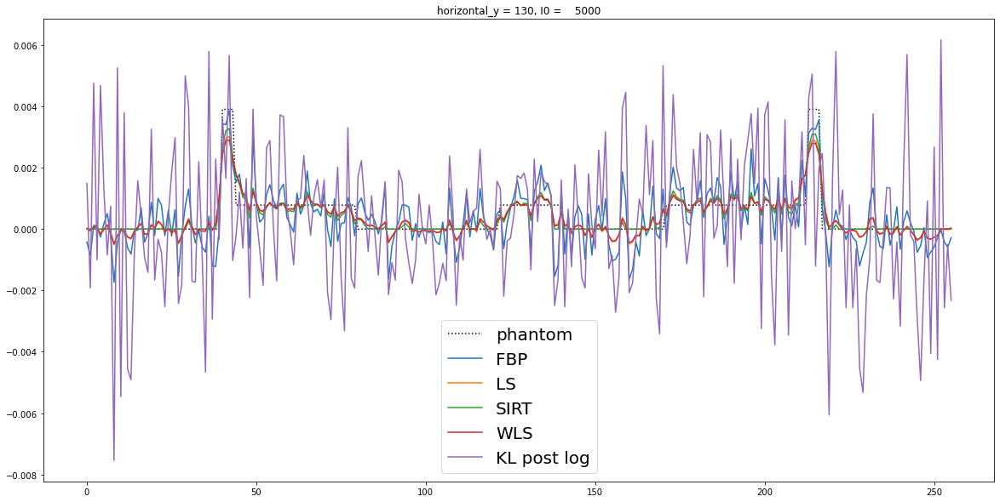

In [313]:
plt.figure(figsize=(20,10))
plt.plot(phantom.get_slice(horizontal_y=linenumy).as_array(),':k',label="phantom")
plt.plot(recon_fbp.get_slice(horizontal_y=linenumy).as_array(),label="FBP")
plt.plot(recon_ls.get_slice(horizontal_y=linenumy).as_array(),label="LS")
plt.plot(recon_sirt_noisy.get_slice(horizontal_y=linenumy).as_array(),label="SIRT")
plt.plot(recon_wls.get_slice(horizontal_y=linenumy).as_array(),label="WLS")
plt.plot(recon_KL.get_slice(horizontal_y=linenumy).as_array(),label="KL post log")
plt.legend(fontsize=20)
plt.title("horizontal_y = %d, I0 = %7.f" % (linenumy, background_counts))
plt.savefig("Line_%d_I0_%7.f.png" %(linenumy, background_counts))

How we want to compare the results with the ones obtained using the sinogram without the noise

In [314]:
# FBP
recon_fbp_no_noise = fbp(sino)
psnr_fbp_no_noise = psnr(phantom,recon_fbp_no_noise)


In [315]:
# LS
f5 = LeastSquares(A, sino)
gd_LS_no_noise = GD(x_init=ig.allocate(), objective_function=f5, step_size=None, 
            max_iteration=1000, update_objective_interval = 10)
gd_LS_no_noise.run(100, verbose=1)
recon_ls_no_noise = gd_LS_no_noise.solution
psnr_ls_no_noise  = psnr(phantom,recon_ls_no_noise, data_range = np.max(phantom))

GD setting up
GD configured
     Iter   Max Iter     Time/Iter            Objective
                               [s]                     
        0       1000         0.000          9.32986e+02
       10       1000         0.081          3.13518e+01
       20       1000         0.062          1.61908e+01
       30       1000         0.055          1.03127e+01
       40       1000         0.052          7.22041e+00
       50       1000         0.050          5.33443e+00
       60       1000         0.049          4.08616e+00
       70       1000         0.048          3.21590e+00
       80       1000         0.048          2.58619e+00
       90       1000         0.047          2.11722e+00
      100       1000         0.047          1.75964e+00
-------------------------------------------------------
      100       1000         0.047          1.75964e+00
Stop criterion has been reached.



In [316]:
# SIRT
x1 = ig.allocate()
sirt_no_noise = SIRT(max_iteration=100)
sirt_no_noise.set_up(initial=x1, 
                operator=A, 
                constraint=constraint, 
                data=sino)
sirt_no_noise.update_objective_interval = 10
sirt_no_noise.run(100)
recon_sirt_no_noise = sirt_no_noise.solution
psnr_sirt_no_noise = psnr(phantom,recon_sirt_no_noise, np.max(phantom))

SIRT setting up
SIRT configured
     Iter   Max Iter     Time/Iter            Objective
                               [s]                     
        0        100         0.000          9.32986e+02
       10        100         0.022          2.01460e+01
       20        100         0.022          8.85272e+00
       30        100         0.023          5.07954e+00
       40        100         0.023          3.29391e+00
       50        100         0.023          2.29521e+00
       60        100         0.023          1.68060e+00
       70        100         0.023          1.27764e+00
       80        100         0.023          9.99938e-01
       90        100         0.023          8.01570e-01
      100        100         0.023          6.55929e-01
-------------------------------------------------------
      100        100         0.023          6.55929e-01
Stop criterion has been reached.



In [317]:
# WLS
weights2 = counts/background_counts
c2 = DataContainer(weights2)
print(c.shape)
f6 = LeastSquares(A, sino, 1,c2)
gd_wls_no_noise = GD(x_init=ig.allocate(), objective_function=f6, step_size=None, 
            max_iteration=1000, update_objective_interval = 10)
gd_wls_no_noise.run(100, verbose=1)
recon_wls_no_noise = gd_wls_no_noise.solution
psnr_wls_no_noise  = psnr(phantom,recon_wls_no_noise, data_range = np.max(phantom))

(500, 256)
GD setting up
GD configured
     Iter   Max Iter     Time/Iter            Objective
                               [s]                     
        0       1000         0.000          8.44854e+02
       10       1000         0.082          3.10277e+01
       20       1000         0.063          1.61806e+01
       30       1000         0.056          1.04261e+01
       40       1000         0.053          7.37962e+00
       50       1000         0.051          5.50679e+00
       60       1000         0.049          4.25619e+00
       70       1000         0.048          3.37620e+00
       80       1000         0.048          2.73360e+00
       90       1000         0.047          2.25087e+00
      100       1000         0.047          1.87985e+00
-------------------------------------------------------
      100       1000         0.047          1.87985e+00
Stop criterion has been reached.



In [318]:
#KL
F2 = KullbackLeibler(b = sino)
G = ZeroFunction()
max_iterations = 500 
pdhg_no_noise = PDHG(f = F2, g = G,operator = K,
            max_iteration = max_iterations, update_objective_interval = 10)
pdhg_no_noise.run(verbose = 2, print_interval=10)
recon_KL_no_noise = pdhg_no_noise.solution
psnr_KL_no_noise = psnr(phantom,recon_KL_no_noise,np.max(phantom))

PDHG setting up
PDHG configured
     Iter   Max Iter     Time/Iter        Primal          Dual     Primal-Dual
                               [s]     Objective     Objective             Gap
        0        500         0.000            inf  -0.00000e+00            inf
       10        500         0.056            inf  -8.07922e+04            inf
       20        500         0.059            inf  -4.36620e+04            inf
       30        500         0.061            inf  -3.01429e+04            inf
       40        500         0.060            inf  -2.09710e+04            inf
       50        500         0.060            inf  -1.63407e+04            inf
       60        500         0.059            inf  -1.46851e+04            inf
       70        500         0.058            inf  -1.16818e+04            inf
       80        500         0.057            inf  -1.02140e+04            inf
       90        500         0.057            inf  -9.42918e+03            inf
      100        500

In [35]:
title2 = 'no noise'
show2D([phantom, recon_fbp_no_noise, recon_ls_no_noise,recon_sirt_no_noise,recon_wls_no_noise,recon_KL_no_noise], ['phantom', "FBP, psnr= %5.3f" % (psnr_fbp_no_noise),"LS, psnr= %5.3f" % (psnr_ls_no_noise),"SIRT, psnr= %5.3f" % (psnr_sirt_no_noise),"WLS, psnr= %5.3f" % (psnr_wls_no_noise),"KL post log, psnr= %5.3f" % (psnr_KL_no_noise)], \
       cmap=cmap, fix_range =(0,1), num_cols=3, size=(15,10), origin='upper-left')
plt.savefig('no_noise.png')

NameError: name 'recon_fbp_no_noise' is not defined